In [16]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
debussy_file = 'audio/debussy.wav'
redhot_file = 'audio/redhot.wav'
duke_file = 'audio/duke.wav'

In [3]:
ipd.Audio(debussy_file)

In [4]:
ipd.Audio(redhot_file)

In [5]:
ipd.Audio(duke_file)

In [6]:
debussy, sr = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _  = librosa.load(duke_file)

In [7]:
debussy

array([-0.01742554, -0.03567505, -0.04995728, ...,  0.00912476,
        0.00866699,  0.00964355], dtype=float32)

In [8]:
debussy.size

661500

In [10]:
# duration of 1 sample
sample_duration = 1 / sr
print(f'Duration of a sample is: {sample_duration:.6f} seconds') 

Duration of a sample is: 0.000045 seconds


In [11]:
# Duration of the signal is 
duration = sample_duration * len(debussy)
print(f'Duration of signal is: {duration:.2f} seconds')

Duration of signal is: 30.00 seconds


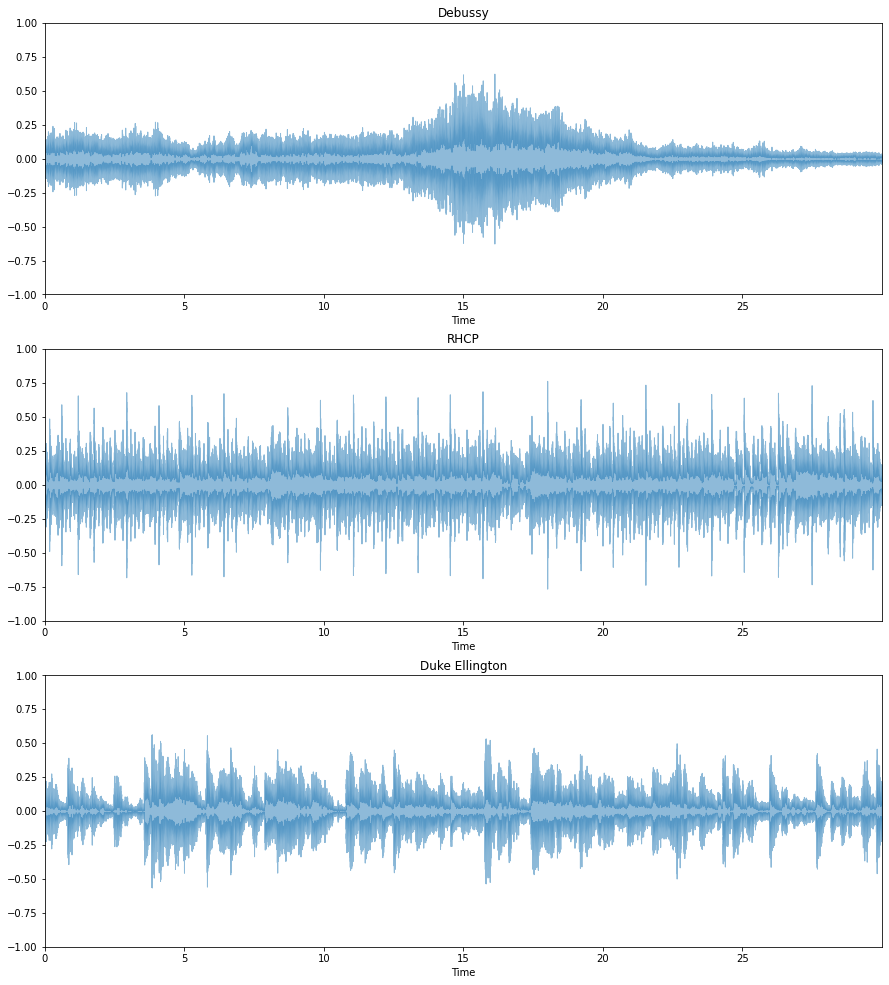

In [13]:
# visualise the waveforms

plt.figure(figsize=(15,17))


plt.subplot(3, 1, 1)
librosa.display.waveplot(debussy, alpha=0.5)
plt.title('Debussy')
plt.ylim(-1, 1)

plt.subplot(3, 1, 2)
librosa.display.waveplot(redhot, alpha=0.5)
plt.title('RHCP')
plt.ylim(-1, 1)

plt.subplot(3, 1, 3)
librosa.display.waveplot(duke, alpha=0.5)
plt.title('Duke Ellington')
plt.ylim(-1, 1)

plt.show()

In [31]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

# calculate the amplitude envelope
def amplitude_envelope(signal, frame_size, hop_length):
    amplitude_envelope = []

    # calculate AE for each frame
    for i in range(0, len(signal), hop_length):
        current_ae = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_ae)
    
    return np.array(amplitude_envelope)

def fancy_amplitude_envelope(signal, frame_size, hop_length):
    return np.array([max(signal[i: i+frame_size]) for i in range(0, len(signal), hop_length)])

In [32]:
ae_debussy = amplitude_envelope(debussy, FRAME_SIZE, HOP_LENGTH)
len(ae_debussy)

1292

In [33]:
fancy_ae_debussy = fancy_amplitude_envelope(debussy, FRAME_SIZE, HOP_LENGTH)
len(fancy_ae_debussy)

1292

In [34]:
ae_redhot = fancy_amplitude_envelope(redhot, FRAME_SIZE, HOP_LENGTH)
ae_duke = fancy_amplitude_envelope(duke, FRAME_SIZE, HOP_LENGTH)

In [35]:
(ae_debussy == fancy_ae_debussy).all()

True

(-1.0, 1.0)

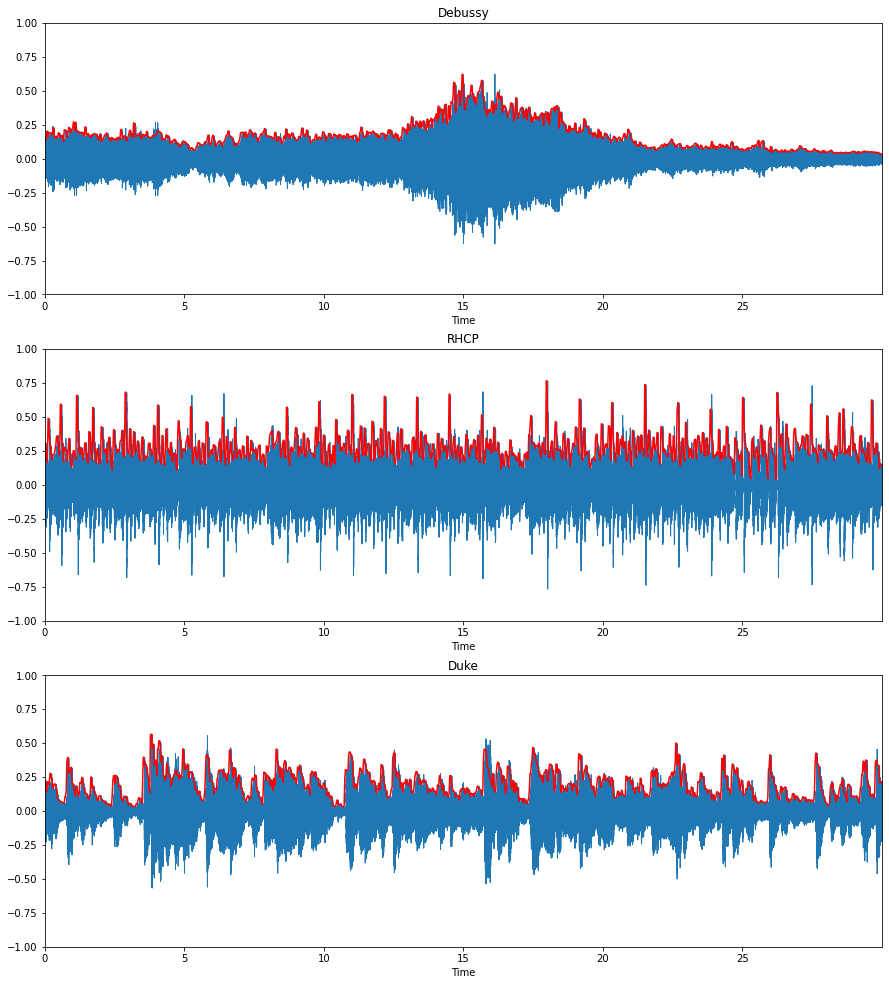

In [37]:
# visualise ampitude envelope for all the files

frames = range(0,ae_debussy.size)
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

plt.figure(figsize=(15,17))

plt.subplot(3, 1, 1)
librosa.display.waveplot(debussy)
plt.plot(t, ae_debussy, color='r')
plt.title('Debussy')
plt.ylim(-1, 1)

plt.subplot(3, 1, 2)
librosa.display.waveplot(redhot)
plt.plot(t, ae_redhot, color='r')
plt.title('RHCP')
plt.ylim(-1, 1)

plt.subplot(3, 1, 3)
librosa.display.waveplot(duke)
plt.plot(t, ae_duke, color='r')
plt.title('Duke')
plt.ylim(-1, 1)
